# Image registration process

Preparation

In [1]:
import torch
import os
from PIL import Image

import torchvision
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.utils import make_grid, save_image
from torchvision.transforms.functional import rotate, crop

from dataset import affine_transform, matrix_transform_coordinate2image, matrix_calculation_function
from model import ImageRegistration
from matching_point_plot import plot_matches

In [2]:
from matplotlib import pyplot as plt
def imshow(image, color = "gray"):
    img = image.clone()
    assert img.dim() > 1
    if img.dim() == 2:
        img = img.unsqueeze(0).unsqueeze(0)
    elif img.dim() == 3:
        img = img.unsqueeze(0)
    B = img.shape[0]
    img = img.view(B, -1, img.shape[-2], img.shape[-1])
    N = img.shape[1]
    plt.figure(figsize=(5*N,5*B))
    for j in range(B):
        for i in range(N):
            plt.subplot(B, N, j * N + i + 1)
            plt.imshow(img[j,i, ...], cmap=color)
            plt.grid(False)
            plt.axis('off')
    plt.show()

## Input image pairs.

image_list1, list of moving image names (str).

image_list2, list of fixed image names (str).

spath, folder path of images.

test_dict, dict contains input image pairs for registration.

In [3]:
image_list1 = [
    "2021-09-27_RenataPlate1_A5_1.tif_03.jpg",
    "2021-09-27_RenataPlate1_H8_1.tif_06.jpg",
    "2022-04-11_QiaoPlate1_B2_1.tif_07.jpg",
    "2022-04-11_QiaoPlate1_C3_1.tif_15.jpg",
    "2022-04-11_QiaoPlate1_E9_1.tif_09.jpg",
    "2021-09-27_RenataPlate1_C7_1.tif_02.jpg",
    "2022-04-11_QiaoPlate1_E5_1.tif_01.jpg",
]

image_list2 = [
    "2021-09-27_RenataPlate1_C7_1.tif_09.jpg",
    "2021-09-27_RenataPlate1_H8_1.tif_08.jpg",
    "2022-04-11_QiaoPlate1_B2_1.tif_64.jpg",
    "2022-04-11_QiaoPlate1_C3_1.tif_19.jpg",
    "2022-04-11_QiaoPlate1_E9_1.tif_72.jpg",
    "2021-09-27_RenataPlate1_A5_1.tif_08.jpg",
    "2022-04-11_QiaoPlate1_E5_1.tif_78.jpg",
]

spath = 'test_image'
test_dict = {
    'Template_image':[],
    'Target_image':[],
}

for i, (item1, item2) in enumerate(zip(image_list1, image_list2)):

    im1 = Image.open(os.path.join(spath, item1)).resize((512, 512))
    im2 = Image.open(os.path.join(spath, item2)).resize((512, 512))
    image1 = T.ToTensor()(im1).mul(2).add(-1)
    image2 = T.ToTensor()(im2).mul(2).add(-1)

    test_dict['Template_image'].append(image1)
    test_dict['Target_image'].append(image2)

for k, v in test_dict.items():
    test_dict[k] = torch.stack(v,dim=0)

## Model selection

location, saved model file path.

TTN : 11400758 (Up-sampling in backbone, scale detection)

TFN : 11599053 (Up-sampling in backbone)

FTN : 11454725 (scale detection)

FFN : 11454726 (Best result in evaluation)

In [4]:
key_list = ['11400758', '11599053', '11454725', '11454726']
location = "pre_trained"
for i, k in enumerate(key_list):
    print(i, ":", k)
key = int(input())

0 : 11400758
1 : 11599053
2 : 11454725
3 : 11454726
3


In [5]:
model_file = torch.load(os.path.join(location, "Fishscale_registration_{}_40000.pth".format(key_list[key])))

use_scale = model_file['Parameter']['model']['Apply_scale']
print(use_scale)
use_trans = model_file['Parameter']['model']['Trans_correction']
print(use_trans)

model = ImageRegistration(model_file['Parameter']['model'])
model.load_state_dict(model_file["Model_state"])

model.eval()
with torch.no_grad():
    output = model(test_dict)

score_thr = []
for op in output['score_map'][:,:-1,:-1]:
    t = torch.minimum(op.flatten().sort()[0][-3], torch.tensor(0.4))
    score_thr.append(t)

score_thr = torch.Tensor(score_thr).view(-1,1,1)

affine_matirx, matches, num = matrix_calculation_function(output, "Auto", score_thr, not use_scale, True, coordinate = True)
matches = matches.mul(32).add(16)

out_total_image = affine_transform(test_dict['Template_image'], affine_matirx)

False
True


C:\Users\rw17789\.conda\envs\pytorch_gpu\lib\site-packages\e2cnn\nn\modules\r2_conv\basisexpansion_singleblock.py:80: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  ..\aten\src\ATen/native/IndexingUtils.h:30.)
  full_mask[mask] = norms.to(torch.uint8)


## Registration result
Present order: Moving images, transform images, fixed images

C:\Users\rw17789\.conda\envs\pytorch_gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


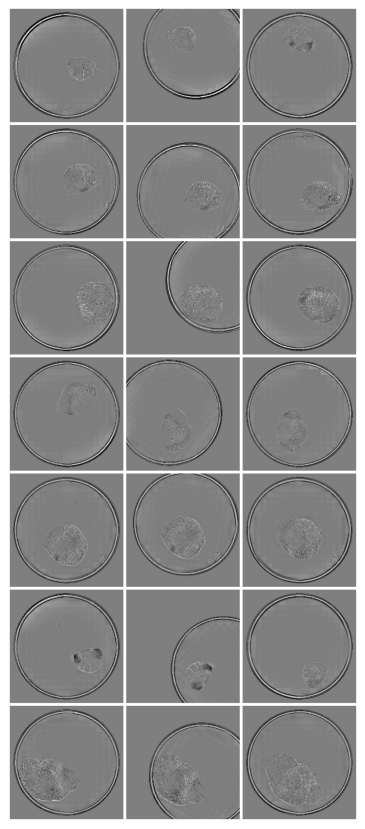

In [7]:
show_image = torch.cat([
    test_dict['Template_image'],
    out_total_image,
    test_dict['Target_image']
], dim = 1)
B, C = show_image.shape[:2]

s = make_grid(
    torch.nn.functional.interpolate(show_image, size = (200,200), mode = 'bilinear').view(B*C, -1, 200,200),
    nrow = C,
    padding = 5,
    normalize = True,
    value_range = (-1,1),
    pad_value = 1
)

plt.figure(figsize=(B*5,C*5))
plt.imshow(s.permute(1,2,0))
plt.axis('off')
plt.show()

## Feature point of interest matching
Whole image matching and Zoom-in result 

Plotting inliers:  9


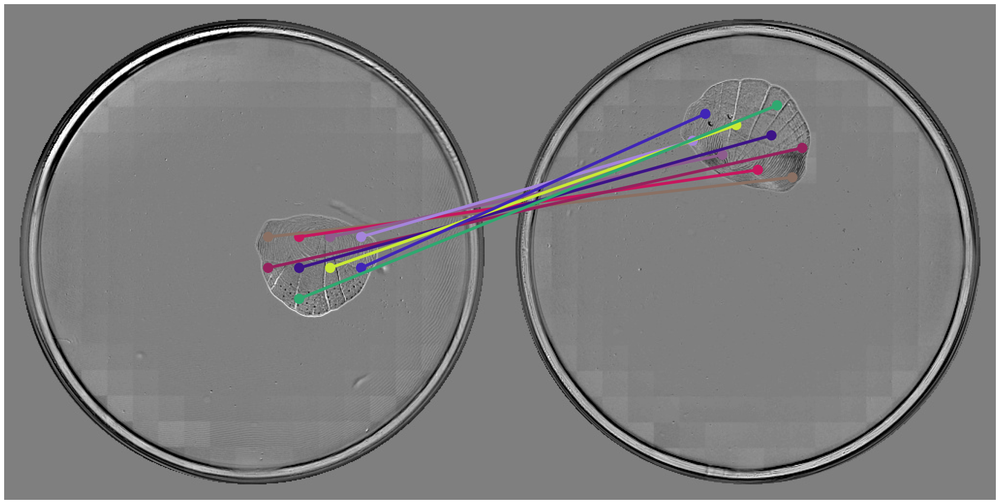

Plotting inliers:  9


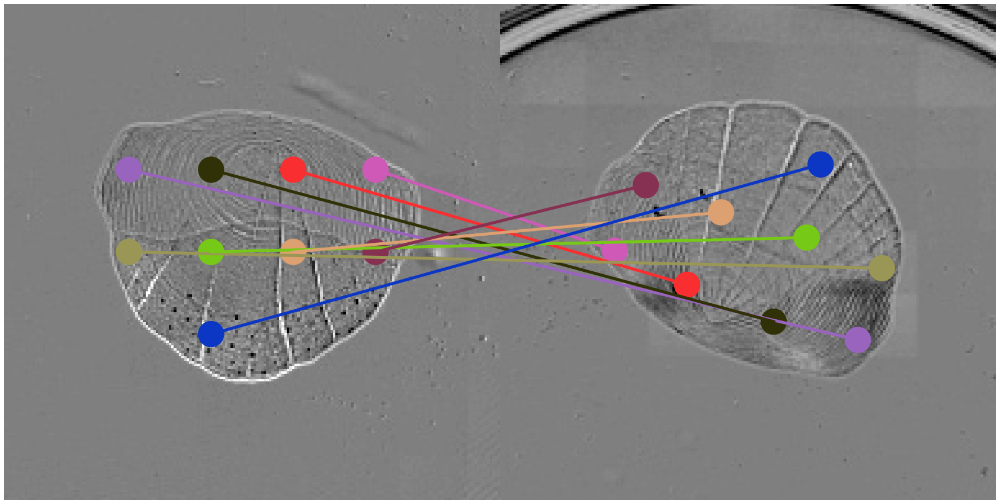

Plotting inliers:  12


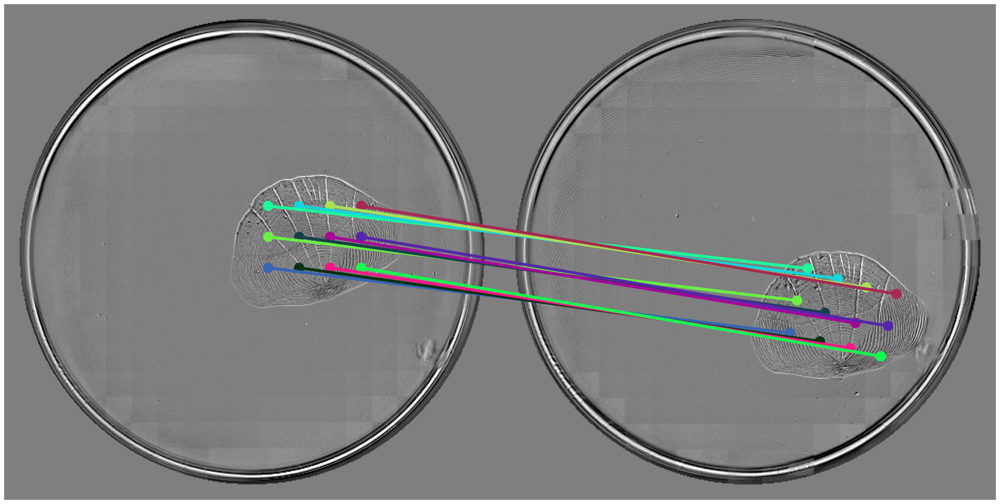

Plotting inliers:  12


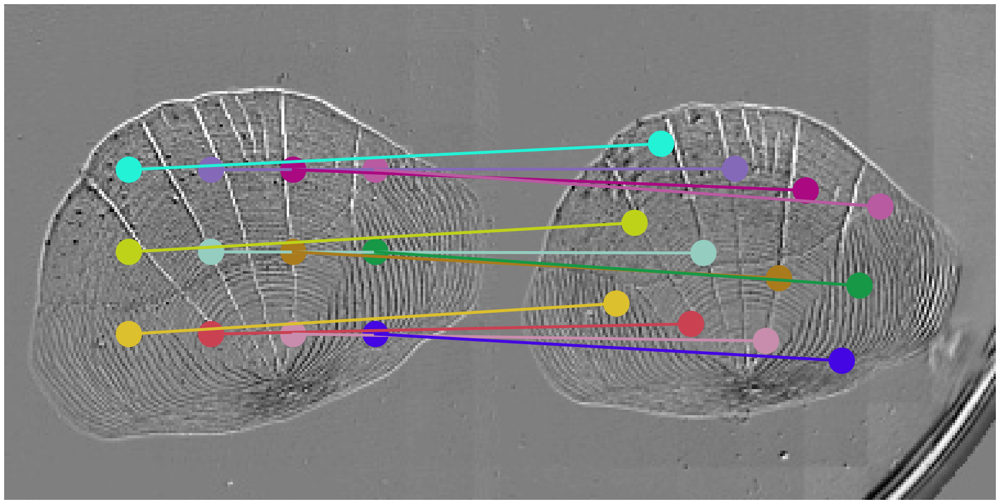

Plotting inliers:  16


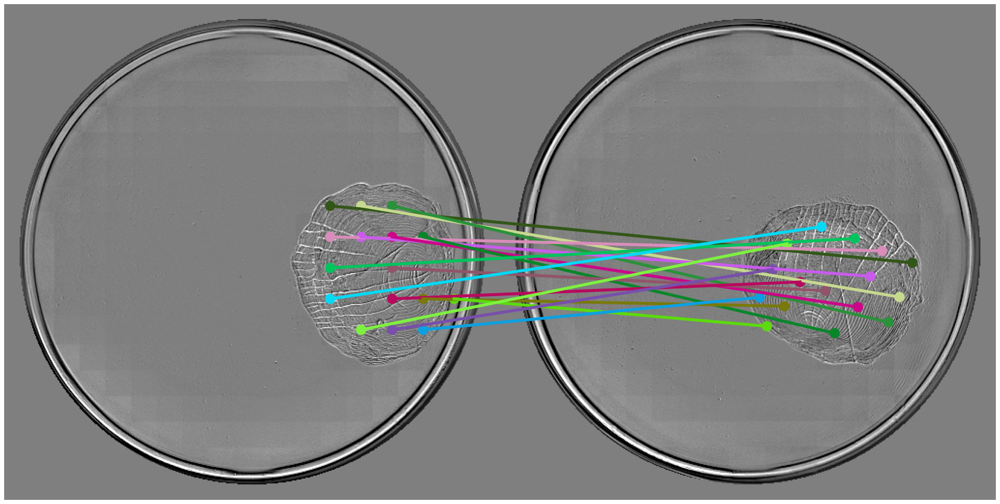

Plotting inliers:  16


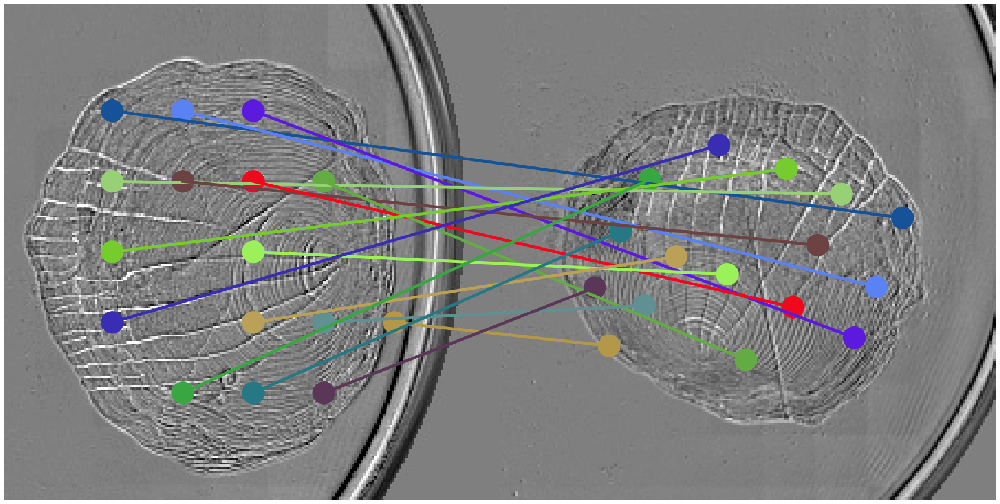

Plotting inliers:  11


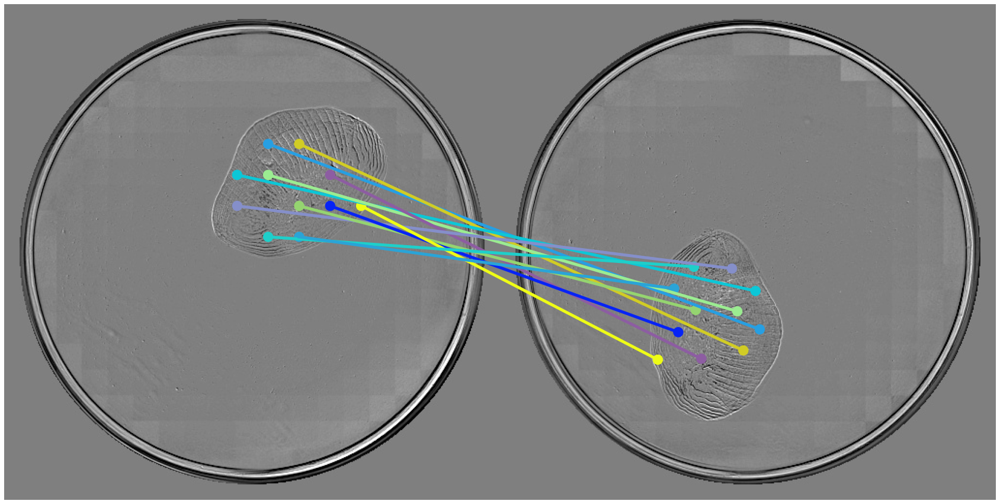

Plotting inliers:  11


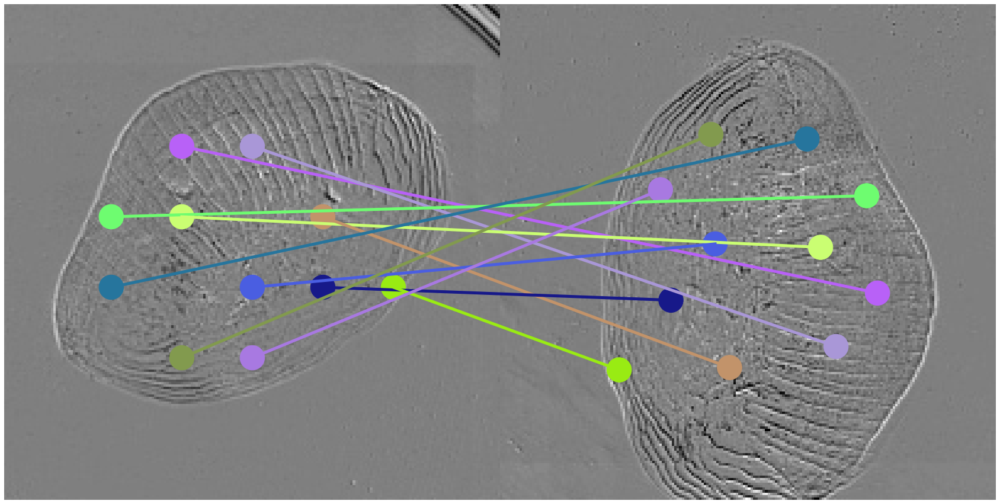

Plotting inliers:  21


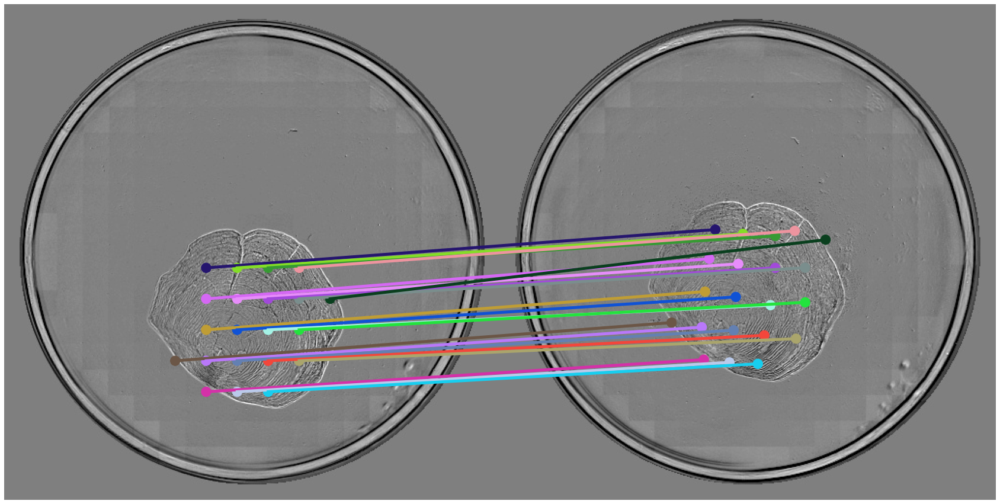

Plotting inliers:  21


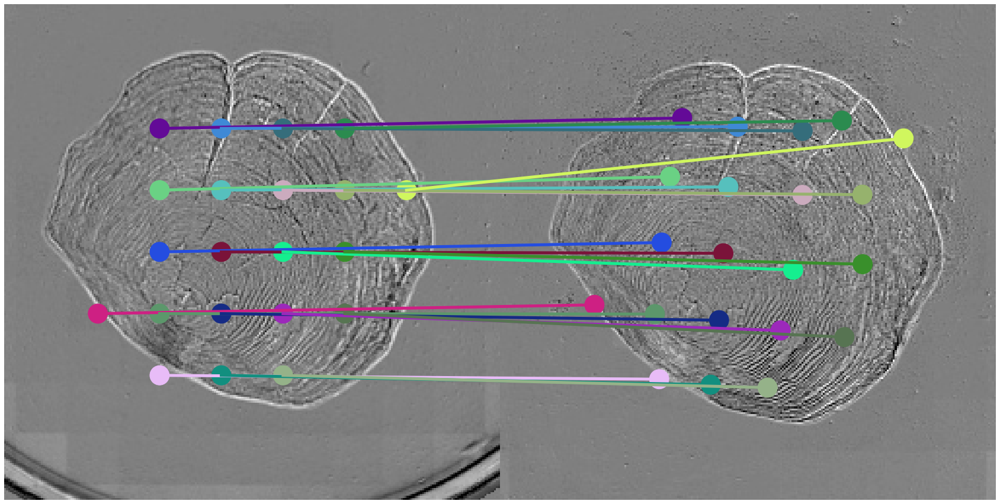

Plotting inliers:  6


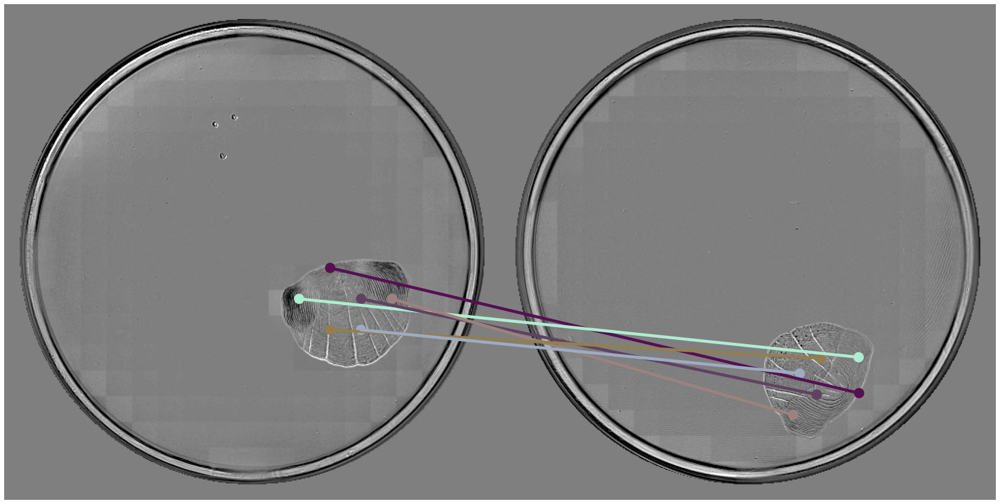

Plotting inliers:  6


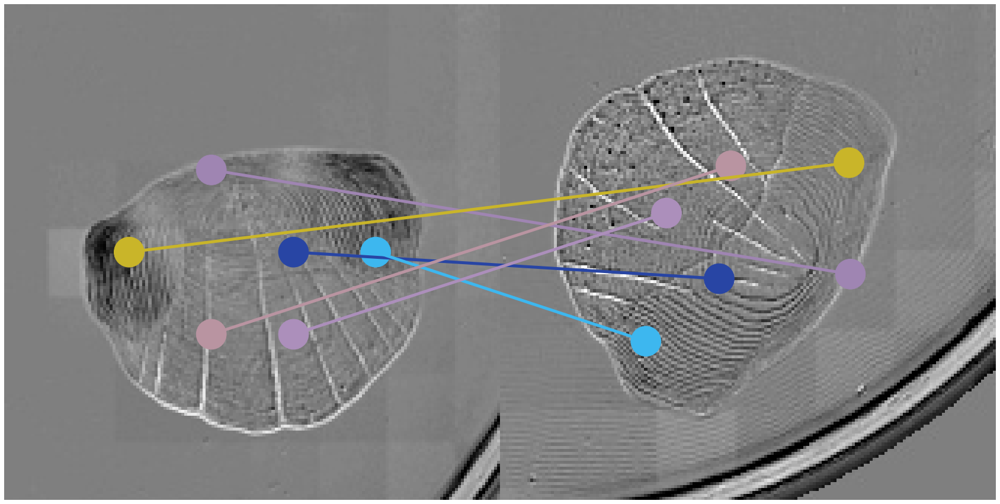

Plotting inliers:  14


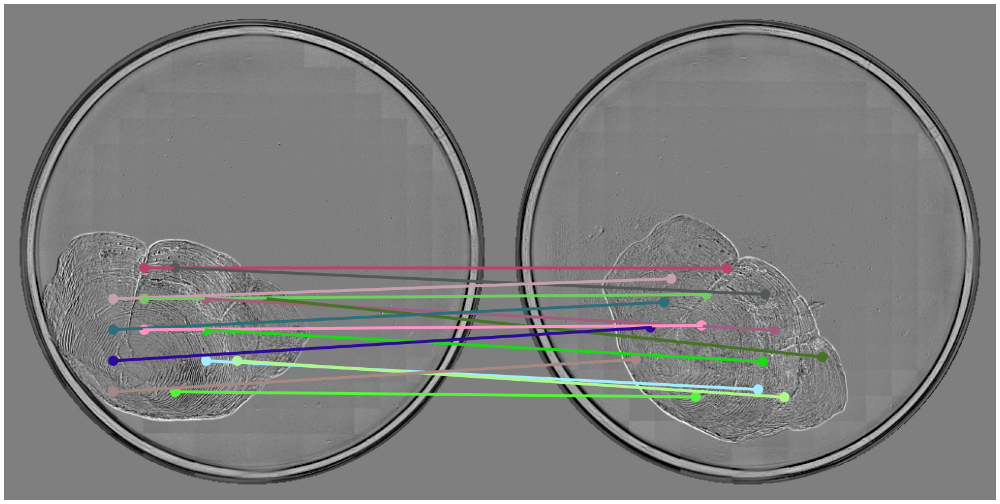

Plotting inliers:  14


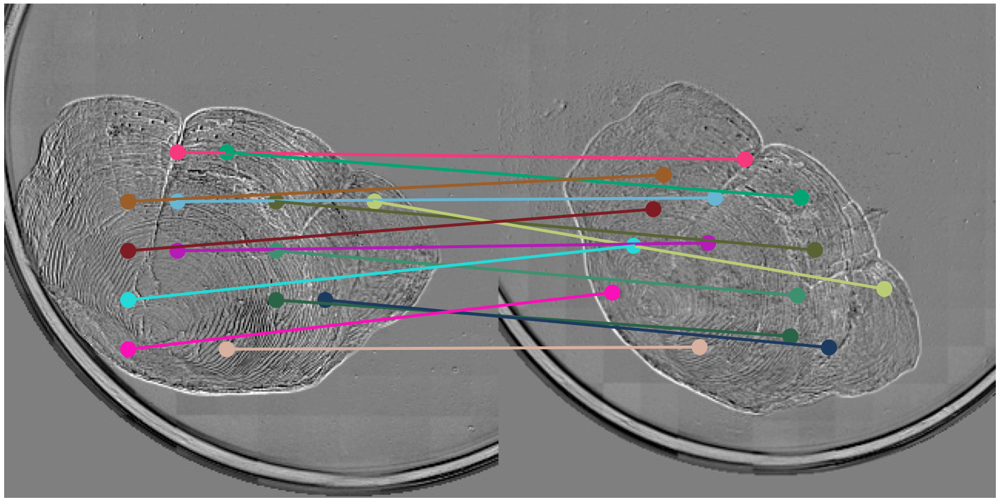

In [42]:
# matches = matches.mul(32).add(16)
for i in range(len(test_dict['Template_image'])):
        
    plot_matches(
        test_dict['Template_image'][i],
        test_dict['Target_image'][i],
        matches[i][: num[i]],
        unnormalize=False, lines = True,
#         dpi=150, 
#         sav_fig="keypoint_matching/unseen_{}_{:0>2d}_original.png".format(key, i)
    )

    wp_min, hp_min, wg_min, hg_min = (matches[i][: num[i]].min(dim=0)[0] - (48 if i != 6 else 80)).clamp(min=0)#.long()

    wp_max, hp_max, wg_max, hg_max = (matches[i][: num[i]].max(dim=0)[0] + (48 if i != 6 else 80)).clamp(max=511)#.long()

    wp_c = (wp_max + wp_min) / 2
    hp_c = (hp_max + hp_min) / 2
    wg_c = (wg_max + wg_min) / 2
    hg_c = (hg_max + hg_min) / 2

    p_e = torch.maximum(wp_max - wp_min, hp_max - hp_min)
    g_e = torch.maximum(wg_max - wg_min, hg_max - hg_min)

    wp_min, hp_min, wg_min, hg_min = wp_c - p_e / 2, hp_c - p_e / 2, wg_c - g_e / 2, hg_c - g_e / 2
    wp_max, hp_max, wg_max, hg_max = wp_c + p_e / 2, hp_c + p_e / 2, wg_c + g_e / 2, hg_c + g_e / 2

    crop_matches = matches[i][: num[i]] - torch.tensor([wp_min, hp_min, wg_min, hg_min]).float().view(1,-1).repeat(num[i],1)

    plot_matches(
        crop(test_dict['Template_image'][i], hp_min.int(), wp_min.int(), (hp_max - hp_min + 1).int(), (wp_max - wp_min + 1).int()),
        crop(test_dict['Target_image'][i], hg_min.int(), wg_min.int(), (hg_max - hg_min + 1).int(), (wg_max - wg_min + 1).int()),
        crop_matches,
        unnormalize=False, lines = True,
#         dpi=200, 
#         sav_fig="keypoint_matching/unseen_{}_{:0>2d}_cropped.png".format(key, i)
    )